In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

In [2]:
class ImageRestorationDataset(Dataset):
    def __init__(self, distorted_dir, clear_dir, transform=None):
        self.distorted_dir = distorted_dir
        self.clear_dir = clear_dir
        self.image_names = sorted(os.listdir(distorted_dir))
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        distorted_path = os.path.join(self.distorted_dir, self.image_names[idx])
        clear_path = os.path.join(self.clear_dir, self.image_names[idx])

        distorted_img = Image.open(distorted_path).convert("RGB")
        clear_img = Image.open(clear_path).convert("RGB")

        if self.transform:
            distorted_img = self.transform(distorted_img)
            clear_img = self.transform(clear_img)

        return distorted_img, clear_img

In [3]:
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, 3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, 3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            )

        def up_block(in_channels, out_channels):
            return nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

        self.enc1 = conv_block(3, 32)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(32, 64)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = conv_block(64, 128)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = conv_block(128, 256)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(256, 512)

        self.up4 = up_block(512, 256)
        self.dec4 = conv_block(512, 256)
        self.up3 = up_block(256, 128)
        self.dec3 = conv_block(256, 128)
        self.up2 = up_block(128, 64)
        self.dec2 = conv_block(128, 64)
        self.up1 = up_block(64, 32)
        self.dec1 = conv_block(64, 32)

        self.final = nn.Conv2d(32, 3, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))

        b = self.bottleneck(self.pool4(e4))

        d4 = self.up4(b)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))
        d3 = self.up3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        return torch.sigmoid(self.final(d1))

In [4]:
# def evaluate(model, dataloader, device):
#     model.eval()
#     psnr_total, ssim_total = 0, 0
#     with torch.no_grad():
#         for distorted, clear in dataloader:
#             distorted, clear = distorted.to(device), clear.to(device)
#             output = model(distorted)

#             for i in range(distorted.size(0)):
#                 output_np = output[i].cpu().permute(1, 2, 0).numpy()
#                 clear_np = clear[i].cpu().permute(1, 2, 0).numpy()

#                 psnr_total += psnr(clear_np, output_np, data_range=1.0)
#                 ssim_total += ssim(clear_np, output_np, channel_axis=2, data_range=1.0)

#     avg_psnr = psnr_total / len(dataloader.dataset)
#     avg_ssim = ssim_total / len(dataloader.dataset)
#     return avg_psnr, avg_ssim
def evaluate(model, dataloader, device, criterion):
    model.eval()
    psnr_total, ssim_total, loss_total = 0, 0, 0
    with torch.no_grad():
        for distorted, clear in dataloader:
            distorted, clear = distorted.to(device), clear.to(device)
            output = model(distorted)

            # Calculate loss
            loss = criterion(output, clear)
            loss_total += loss.item()

            for i in range(distorted.size(0)):
                output_np = output[i].cpu().permute(1, 2, 0).numpy()
                clear_np = clear[i].cpu().permute(1, 2, 0).numpy()

                psnr_total += psnr(clear_np, output_np, data_range=1.0)
                ssim_total += ssim(clear_np, output_np, channel_axis=2, data_range=1.0)

    avg_psnr = psnr_total / len(dataloader.dataset)
    avg_ssim = ssim_total / len(dataloader.dataset)
    avg_loss = loss_total / len(dataloader)
    
    return avg_psnr, avg_ssim, avg_loss


In [5]:
def visualize_sample(model, dataloader, device):
    model.eval()
    distorted, clear = next(iter(dataloader))
    distorted, clear = distorted.to(device), clear.to(device)
    output = model(distorted)

    for i in range(3):
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(distorted[i].cpu().permute(1, 2, 0).numpy())
        axs[0].set_title("Distorted")
        axs[1].imshow(output[i].detach().cpu().permute(1, 2, 0).numpy())
        axs[1].set_title("Restored")
        axs[2].imshow(clear[i].cpu().permute(1, 2, 0).numpy())
        axs[2].set_title("Ground Truth")
        for ax in axs:
            ax.axis("off")
        plt.show()

In [6]:
from torch.utils.data import Dataset
from PIL import Image
import os

class ImageRestorationDataset(Dataset):
    def __init__(self, distorted_dir, clear_dir, transform=None):
        self.distorted_dir = distorted_dir
        self.clear_dir = clear_dir
        self.transform = transform

        self.image_filenames = sorted(os.listdir(distorted_dir))

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        distorted_path = os.path.join(self.distorted_dir, self.image_filenames[idx])
        clear_path = os.path.join(self.clear_dir, self.image_filenames[idx])

        distorted_img = Image.open(distorted_path).convert("RGB")
        clear_img = Image.open(clear_path).convert("RGB")

        if self.transform:
            distorted_img = self.transform(distorted_img)
            clear_img = self.transform(clear_img)

        return distorted_img, clear_img


In [7]:
def train(model, dataloader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for inputs, targets in dataloader:
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    return running_loss / len(dataloader)

Final code

Using device: cuda
Epoch 1, Loss: 0.0591
Validation PSNR: 26.40, SSIM: 0.8565
✅ Best model updated at epoch 1 with PSNR: 26.40
Epoch 2, Loss: 0.0374
Validation PSNR: 28.06, SSIM: 0.8912
✅ Best model updated at epoch 2 with PSNR: 28.06
Epoch 3, Loss: 0.0343
Validation PSNR: 28.60, SSIM: 0.9034
✅ Best model updated at epoch 3 with PSNR: 28.60
Epoch 4, Loss: 0.0320
Validation PSNR: 29.55, SSIM: 0.9095
✅ Best model updated at epoch 4 with PSNR: 29.55
Epoch 5, Loss: 0.0310
Validation PSNR: 29.40, SSIM: 0.9089


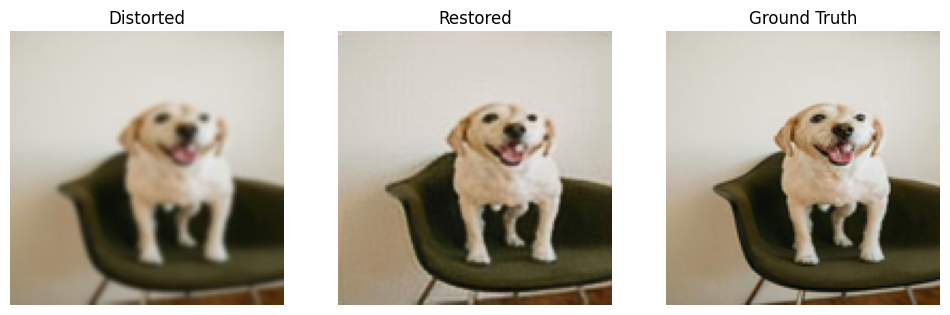

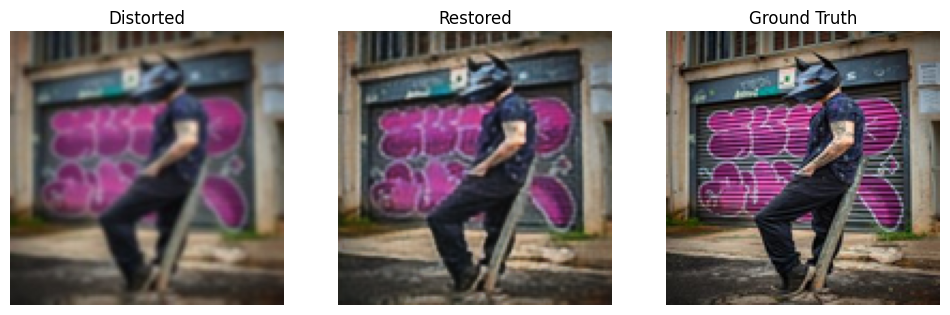

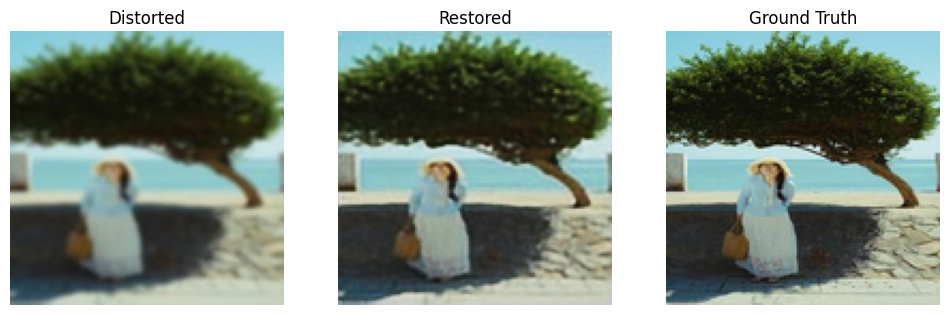

Epoch 6, Loss: 0.0302
Validation PSNR: 29.81, SSIM: 0.9117
✅ Best model updated at epoch 6 with PSNR: 29.81
Epoch 7, Loss: 0.0295
Validation PSNR: 29.77, SSIM: 0.9126
Epoch 8, Loss: 0.0291
Validation PSNR: 30.06, SSIM: 0.9146
✅ Best model updated at epoch 8 with PSNR: 30.06
Epoch 9, Loss: 0.0286
Validation PSNR: 28.98, SSIM: 0.9032
Epoch 10, Loss: 0.0279
Validation PSNR: 29.89, SSIM: 0.9133


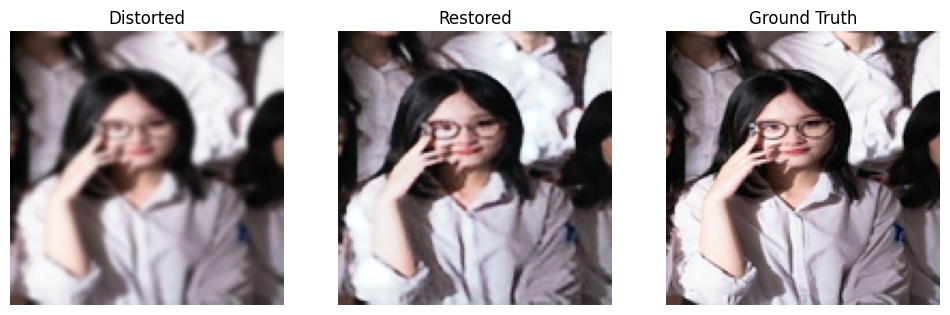

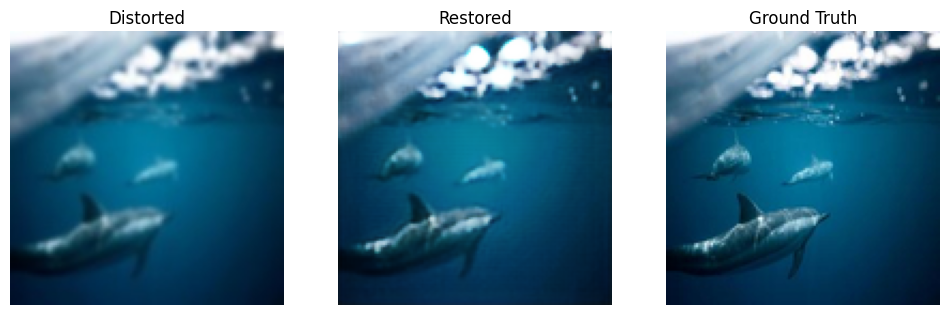

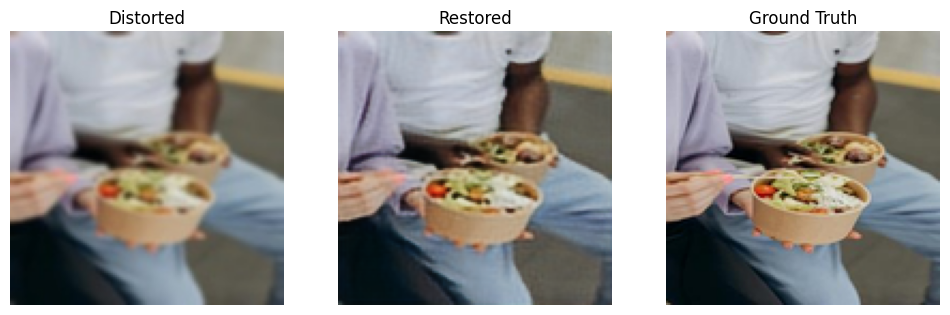

Epoch 11, Loss: 0.0266
Validation PSNR: 29.70, SSIM: 0.9137
Epoch 12, Loss: 0.0261
Validation PSNR: 30.05, SSIM: 0.9134
Epoch 13, Loss: 0.0261
Validation PSNR: 29.57, SSIM: 0.9178
Epoch 14, Loss: 0.0260
Validation PSNR: 29.74, SSIM: 0.9130
Epoch 15, Loss: 0.0258
Validation PSNR: 29.76, SSIM: 0.9171


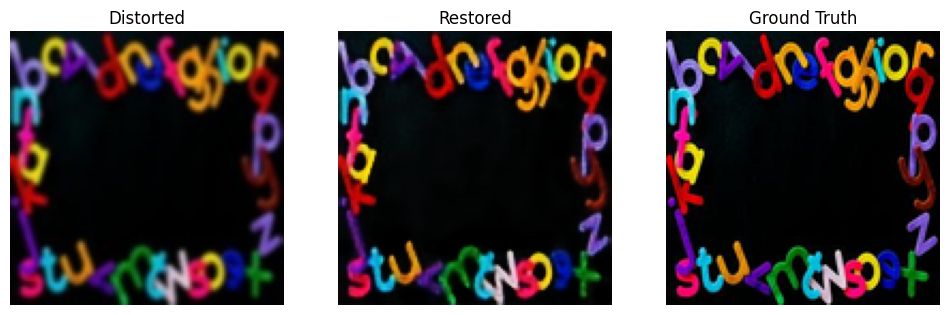

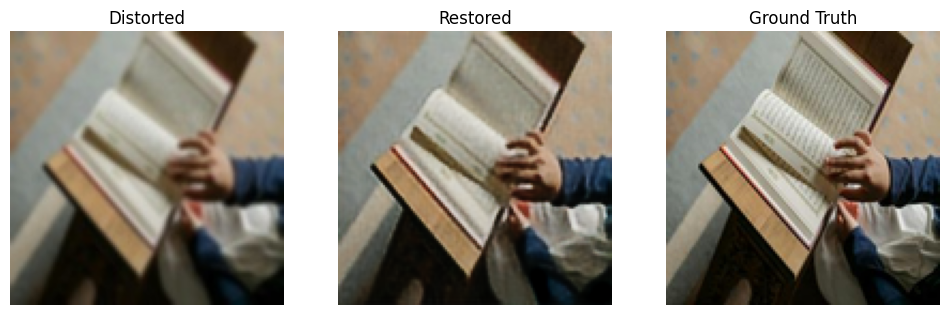

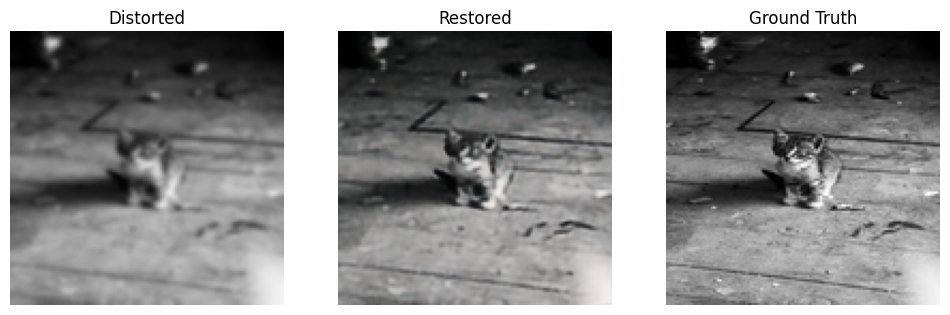

Epoch 16, Loss: 0.0256
Validation PSNR: 30.19, SSIM: 0.9191
✅ Best model updated at epoch 16 with PSNR: 30.19
Epoch 17, Loss: 0.0256
Validation PSNR: 29.95, SSIM: 0.9186
Epoch 18, Loss: 0.0253
Validation PSNR: 30.52, SSIM: 0.9214
✅ Best model updated at epoch 18 with PSNR: 30.52
Epoch 19, Loss: 0.0255
Validation PSNR: 30.26, SSIM: 0.9186
Epoch 20, Loss: 0.0252
Validation PSNR: 30.28, SSIM: 0.9175


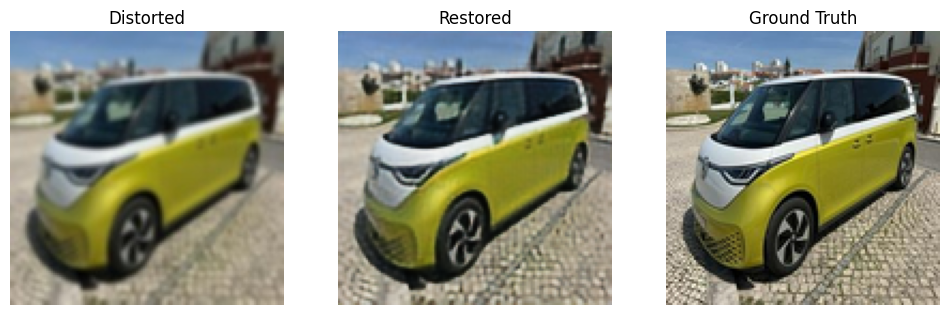

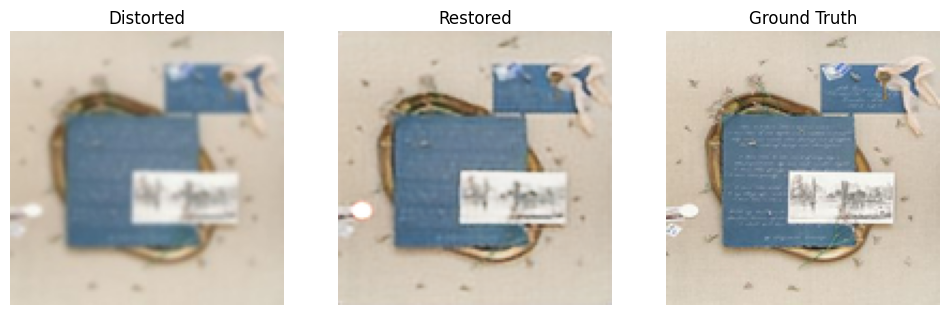

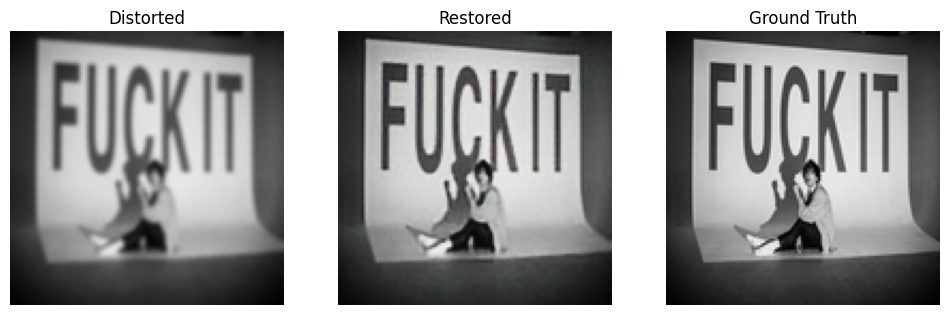

Epoch 21, Loss: 0.0244
Validation PSNR: 30.33, SSIM: 0.9166
Epoch 22, Loss: 0.0244
Validation PSNR: 30.26, SSIM: 0.9139
Epoch 23, Loss: 0.0243
Validation PSNR: 30.55, SSIM: 0.9206
✅ Best model updated at epoch 23 with PSNR: 30.55
Epoch 24, Loss: 0.0242
Validation PSNR: 30.17, SSIM: 0.9118
Epoch 25, Loss: 0.0243
Validation PSNR: 30.27, SSIM: 0.9153


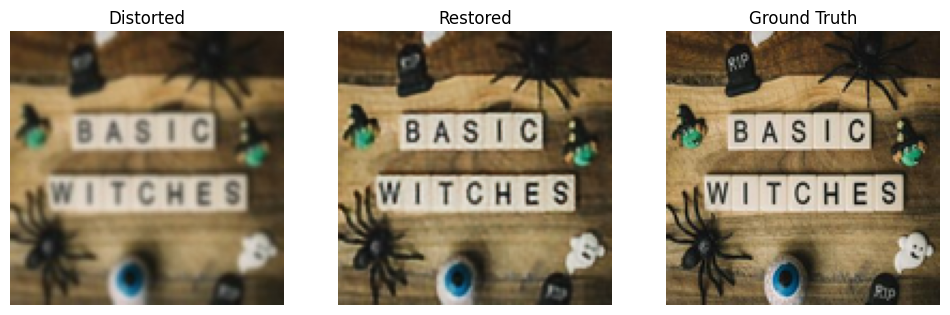

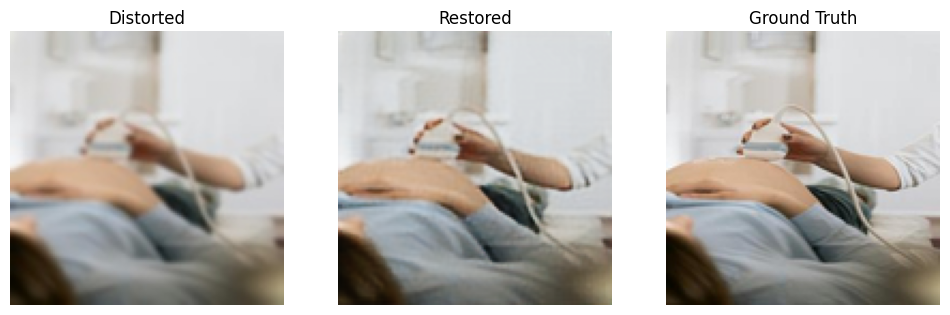

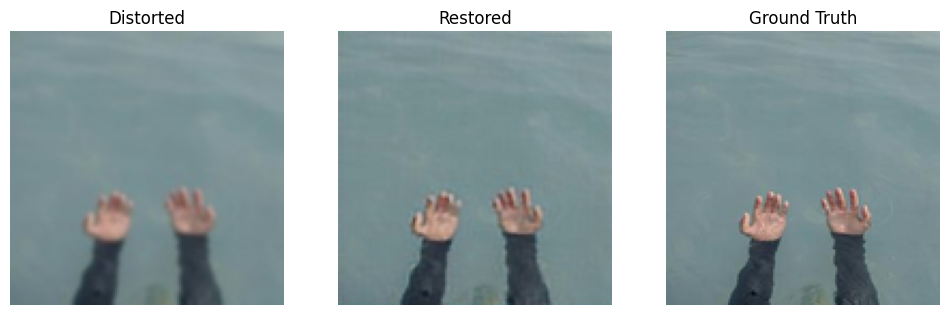

Epoch 26, Loss: 0.0241
Validation PSNR: 30.67, SSIM: 0.9217
✅ Best model updated at epoch 26 with PSNR: 30.67
Epoch 27, Loss: 0.0241
Validation PSNR: 30.46, SSIM: 0.9191
Epoch 28, Loss: 0.0242
Validation PSNR: 30.63, SSIM: 0.9196
Epoch 29, Loss: 0.0239
Validation PSNR: 30.57, SSIM: 0.9205
Epoch 30, Loss: 0.0239
Validation PSNR: 30.66, SSIM: 0.9206


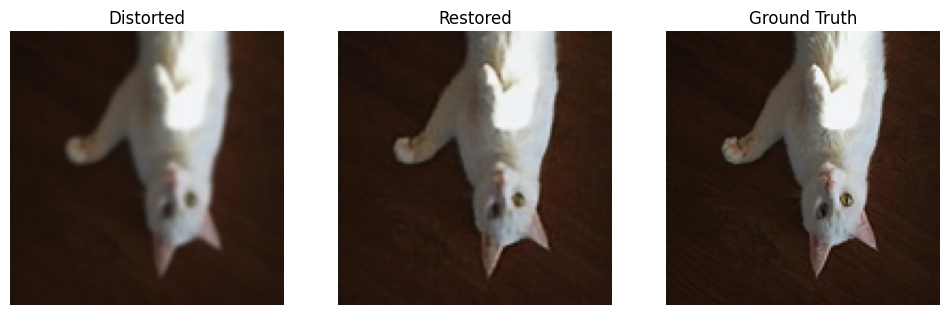

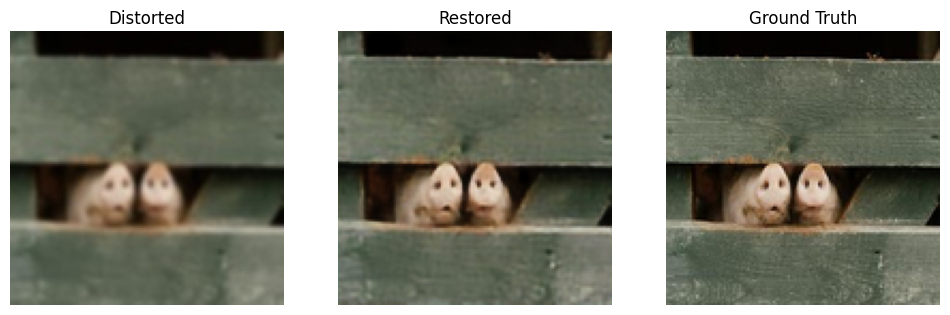

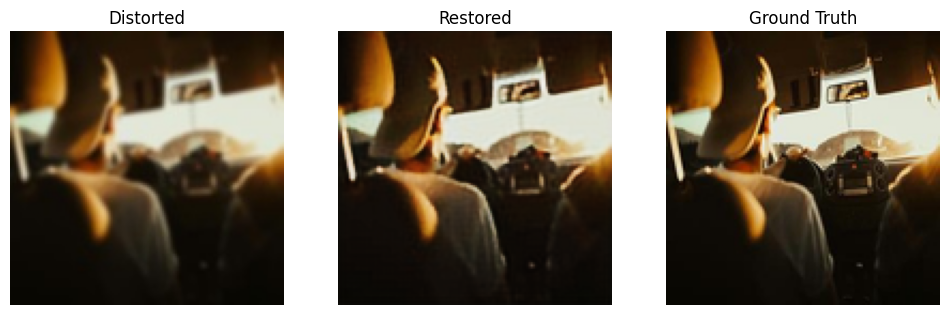

Epoch 31, Loss: 0.0236
Validation PSNR: 30.74, SSIM: 0.9226
✅ Best model updated at epoch 31 with PSNR: 30.74
Epoch 32, Loss: 0.0235
Validation PSNR: 30.44, SSIM: 0.9175
Epoch 33, Loss: 0.0235
Validation PSNR: 30.42, SSIM: 0.9213
Epoch 34, Loss: 0.0234
Validation PSNR: 30.53, SSIM: 0.9158
Epoch 35, Loss: 0.0234
Validation PSNR: 30.18, SSIM: 0.9179


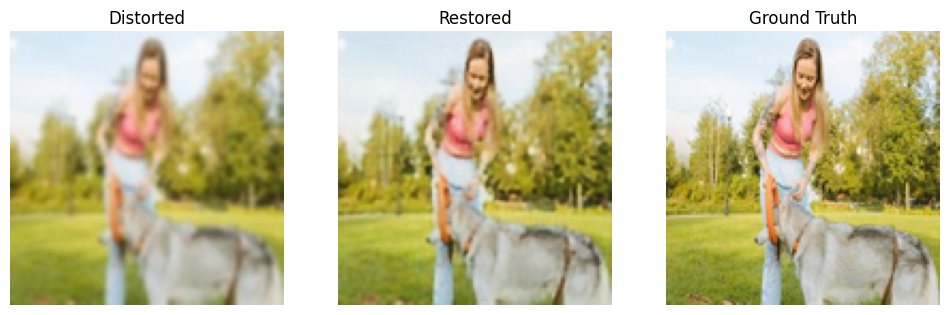

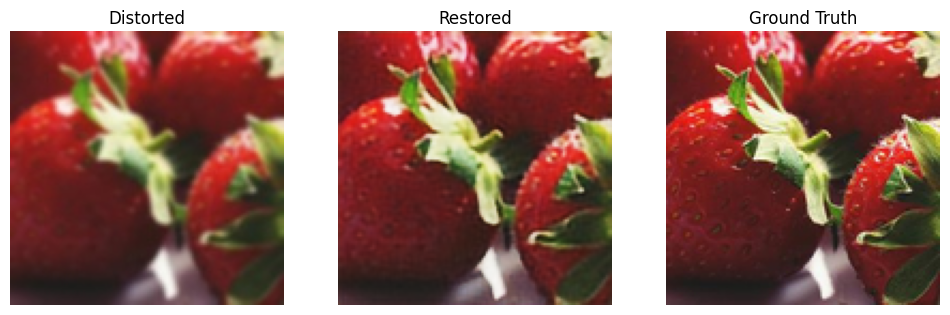

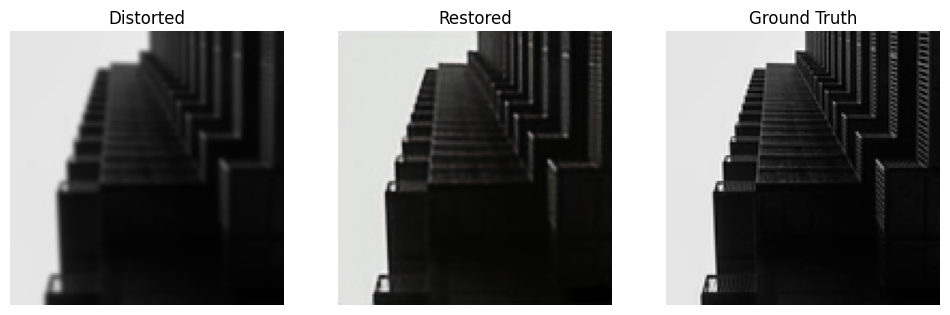

Epoch 36, Loss: 0.0234
Validation PSNR: 30.53, SSIM: 0.9225
Epoch 37, Loss: 0.0234
Validation PSNR: 30.39, SSIM: 0.9149
Epoch 38, Loss: 0.0233
Validation PSNR: 30.43, SSIM: 0.9178
Epoch 39, Loss: 0.0233
Validation PSNR: 30.66, SSIM: 0.9233
Epoch 40, Loss: 0.0234
Validation PSNR: 30.57, SSIM: 0.9176


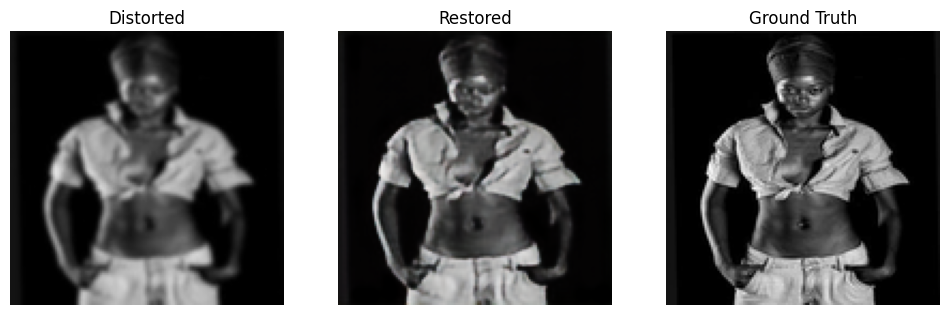

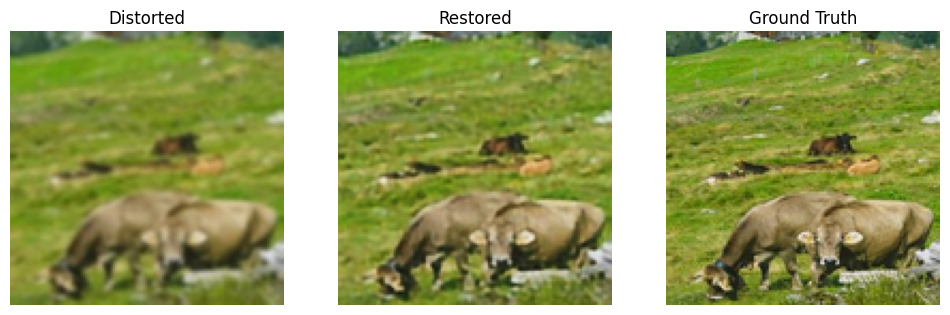

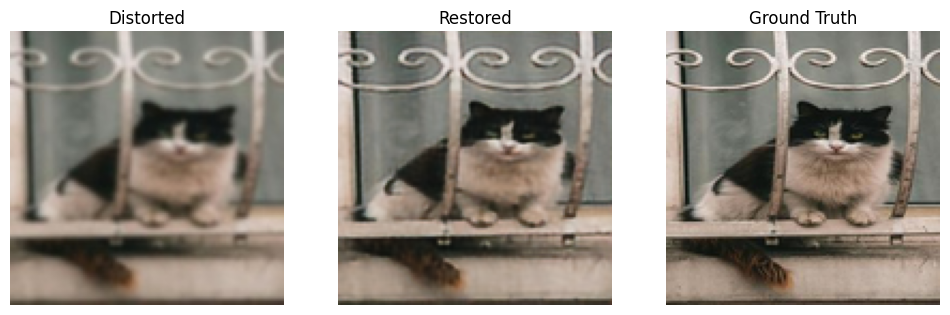

Epoch 41, Loss: 0.0232
Validation PSNR: 30.66, SSIM: 0.9196
Epoch 42, Loss: 0.0231
Validation PSNR: 30.54, SSIM: 0.9210
Epoch 43, Loss: 0.0231
Validation PSNR: 30.55, SSIM: 0.9209
Epoch 44, Loss: 0.0230
Validation PSNR: 30.71, SSIM: 0.9219
Epoch 45, Loss: 0.0231
Validation PSNR: 30.55, SSIM: 0.9196


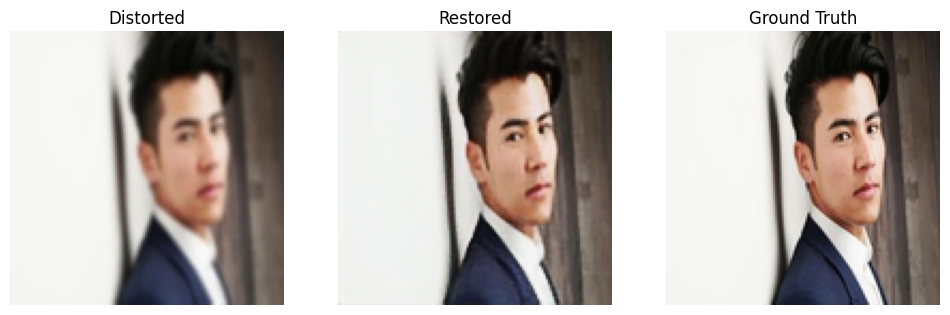

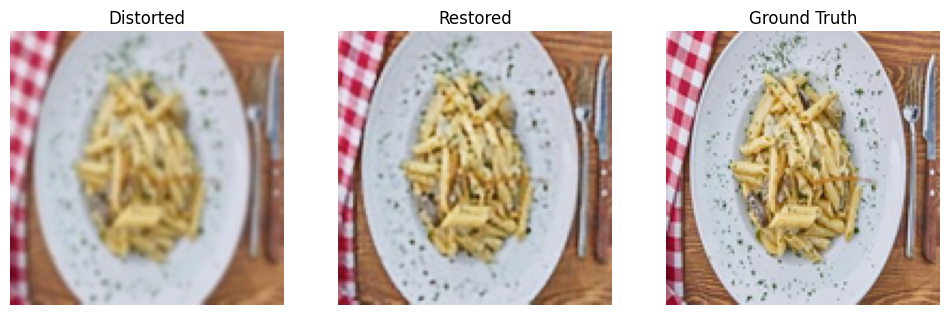

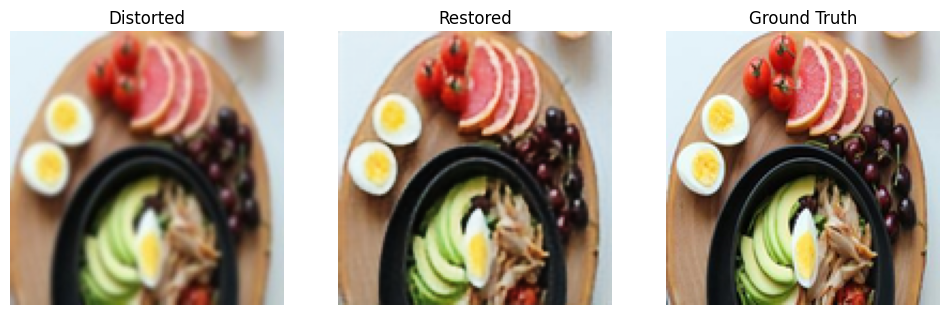

Epoch 46, Loss: 0.0230
Validation PSNR: 30.54, SSIM: 0.9200
Epoch 47, Loss: 0.0230
Validation PSNR: 30.85, SSIM: 0.9229
✅ Best model updated at epoch 47 with PSNR: 30.85
Epoch 48, Loss: 0.0230
Validation PSNR: 30.66, SSIM: 0.9233
Epoch 49, Loss: 0.0230
Validation PSNR: 30.63, SSIM: 0.9210
Epoch 50, Loss: 0.0230
Validation PSNR: 30.56, SSIM: 0.9203


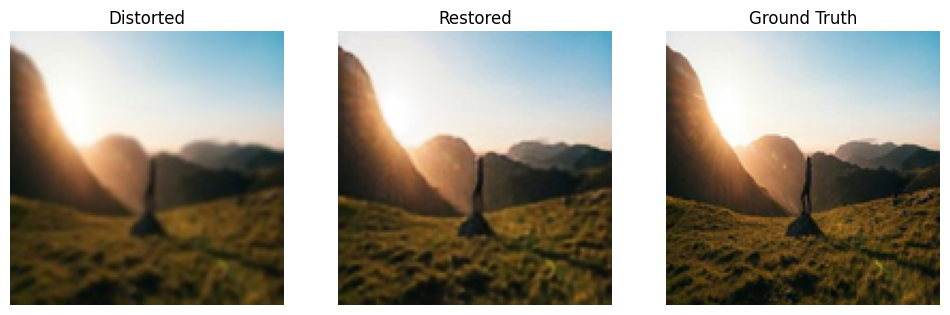

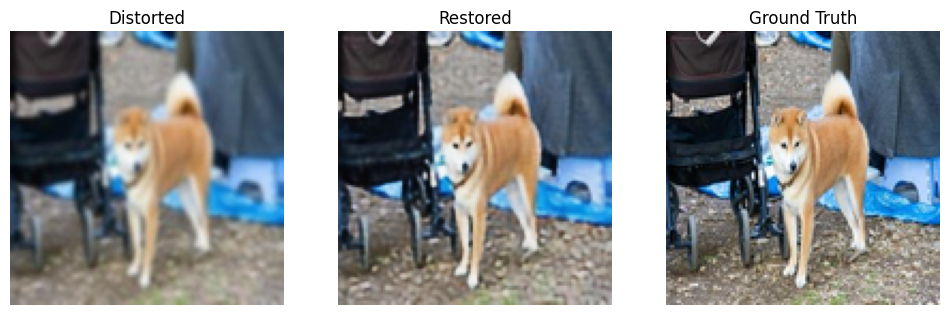

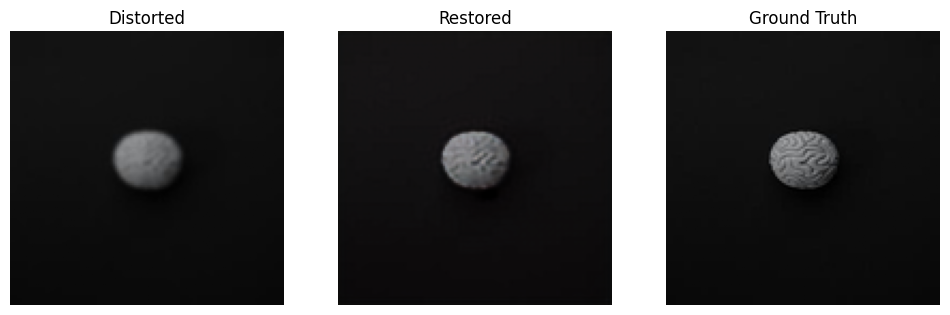

Epoch 51, Loss: 0.0228
Validation PSNR: 30.28, SSIM: 0.9230
Epoch 52, Loss: 0.0229
Validation PSNR: 30.39, SSIM: 0.9164
Epoch 53, Loss: 0.0229
Validation PSNR: 30.66, SSIM: 0.9236
Epoch 54, Loss: 0.0228
Validation PSNR: 30.65, SSIM: 0.9172
Epoch 55, Loss: 0.0228
Validation PSNR: 30.41, SSIM: 0.9162


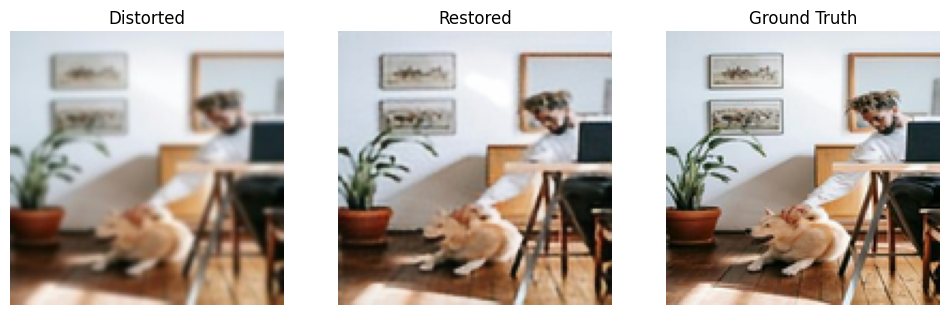

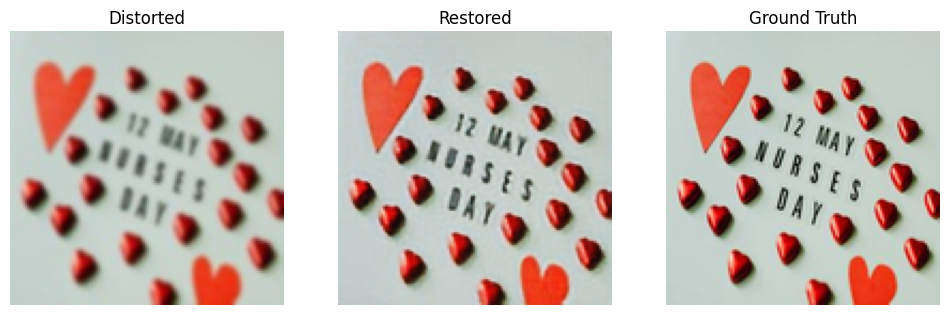

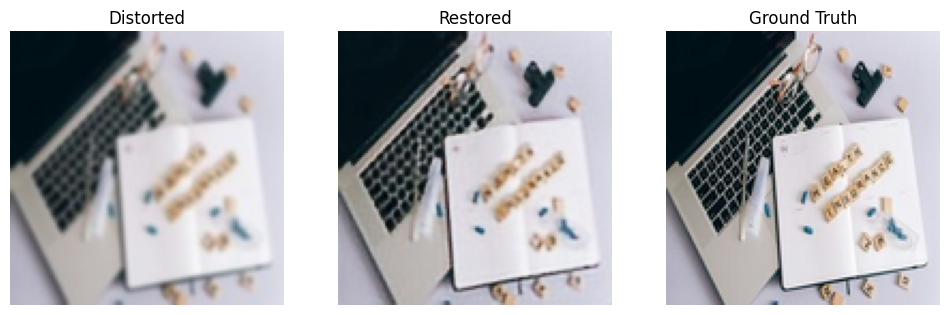

Epoch 56, Loss: 0.0229
Validation PSNR: 30.52, SSIM: 0.9194
Epoch 57, Loss: 0.0229
Validation PSNR: 30.52, SSIM: 0.9181
Epoch 58, Loss: 0.0228
Validation PSNR: 30.65, SSIM: 0.9188
Epoch 59, Loss: 0.0228
Validation PSNR: 30.67, SSIM: 0.9239
Epoch 60, Loss: 0.0228
Validation PSNR: 30.63, SSIM: 0.9228


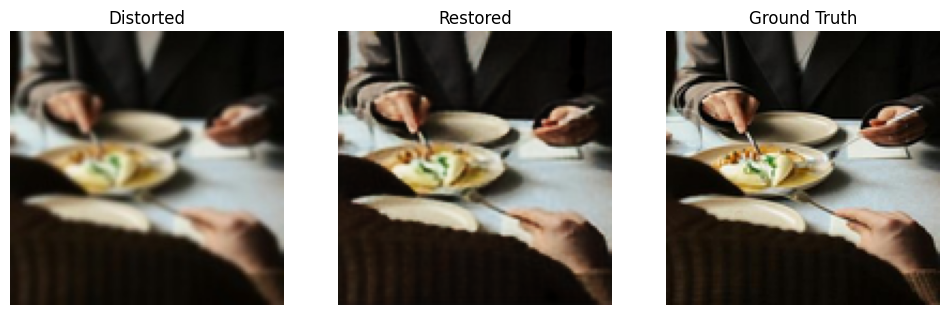

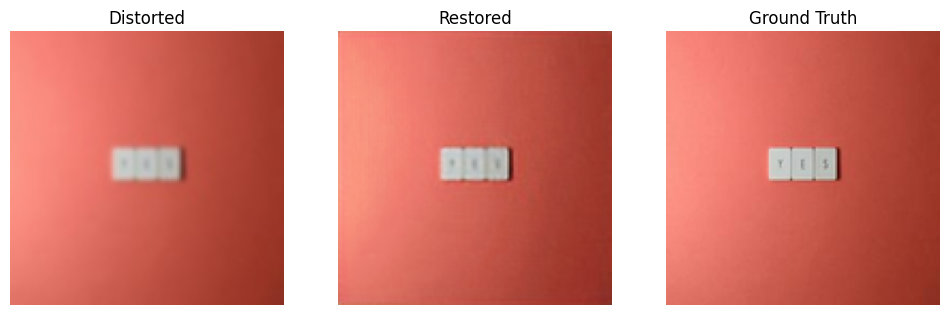

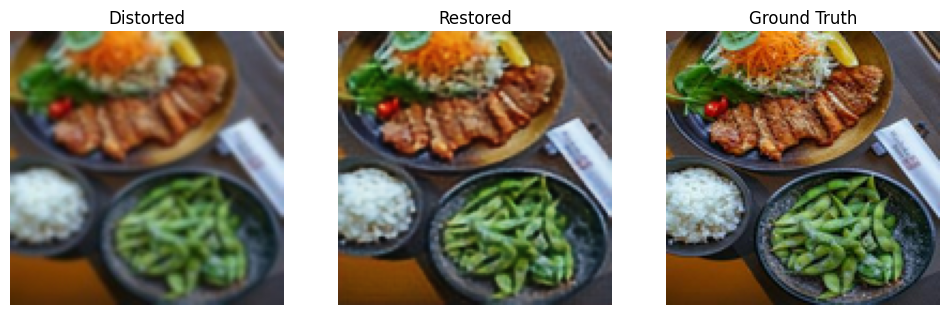

Epoch 61, Loss: 0.0228
Validation PSNR: 30.44, SSIM: 0.9141
Epoch 62, Loss: 0.0227
Validation PSNR: 30.64, SSIM: 0.9217
Epoch 63, Loss: 0.0227
Validation PSNR: 30.77, SSIM: 0.9211
Epoch 64, Loss: 0.0227
Validation PSNR: 30.33, SSIM: 0.9152
Epoch 65, Loss: 0.0228
Validation PSNR: 30.51, SSIM: 0.9167


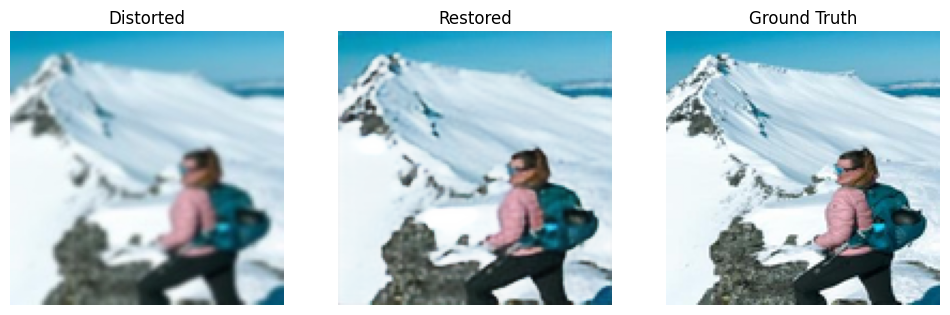

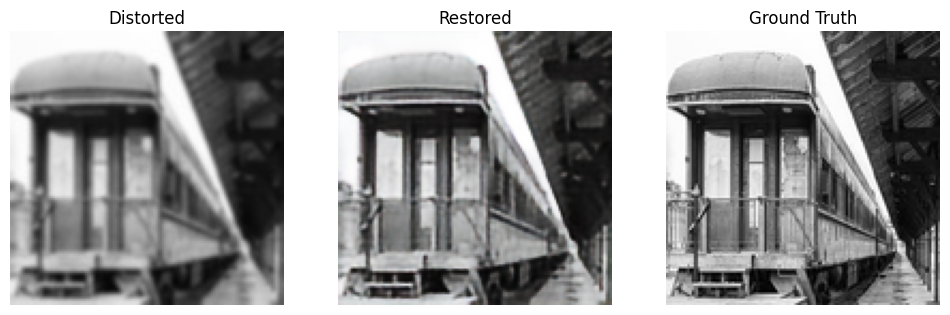

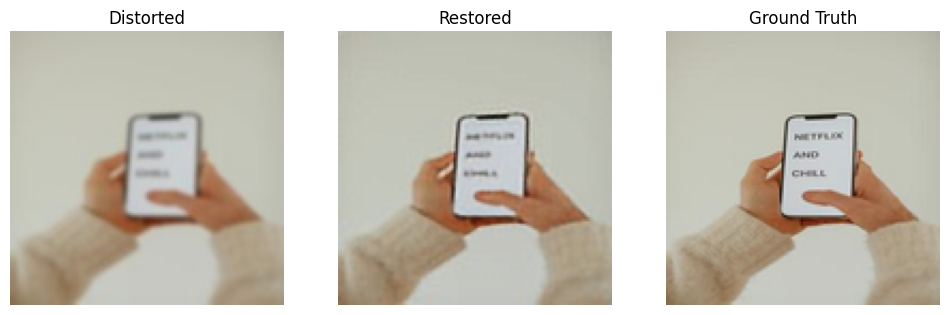

Epoch 66, Loss: 0.0228
Validation PSNR: 30.41, SSIM: 0.9158
Epoch 67, Loss: 0.0227
Validation PSNR: 30.36, SSIM: 0.9194
Epoch 68, Loss: 0.0228
Validation PSNR: 30.60, SSIM: 0.9214
Epoch 69, Loss: 0.0227
Validation PSNR: 30.36, SSIM: 0.9209
Epoch 70, Loss: 0.0227
Validation PSNR: 30.59, SSIM: 0.9190


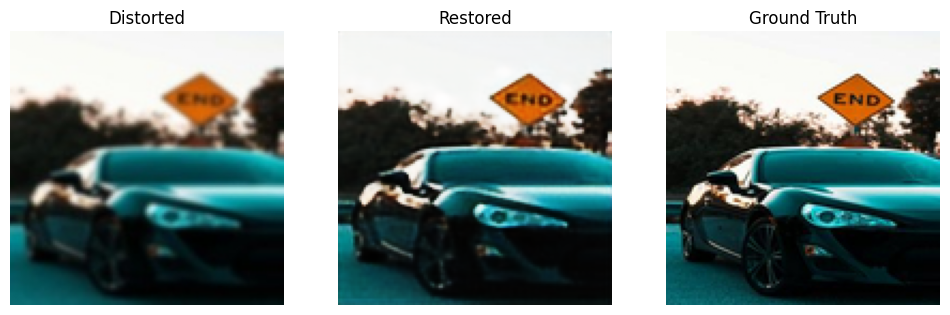

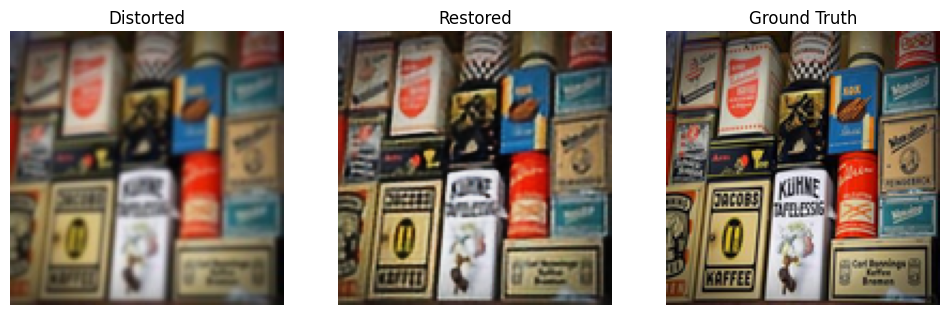

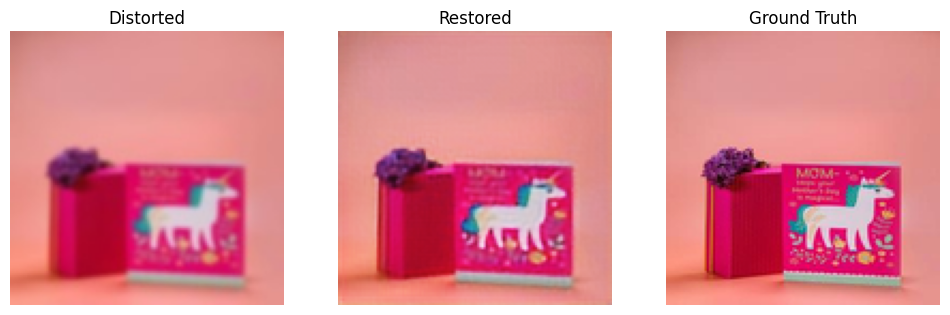

Epoch 71, Loss: 0.0227
Validation PSNR: 30.75, SSIM: 0.9218
Epoch 72, Loss: 0.0227
Validation PSNR: 30.62, SSIM: 0.9211
Epoch 73, Loss: 0.0226
Validation PSNR: 30.72, SSIM: 0.9197
Epoch 74, Loss: 0.0226
Validation PSNR: 30.74, SSIM: 0.9228
Epoch 75, Loss: 0.0227
Validation PSNR: 30.56, SSIM: 0.9173


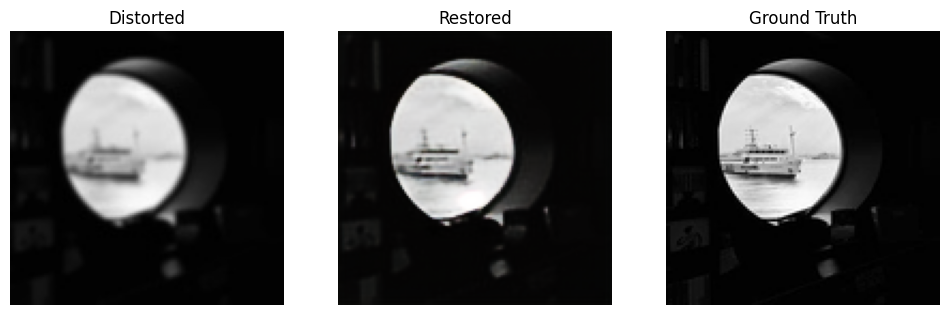

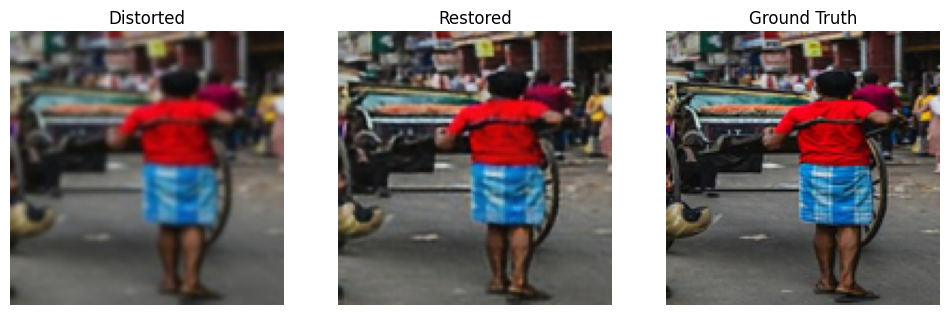

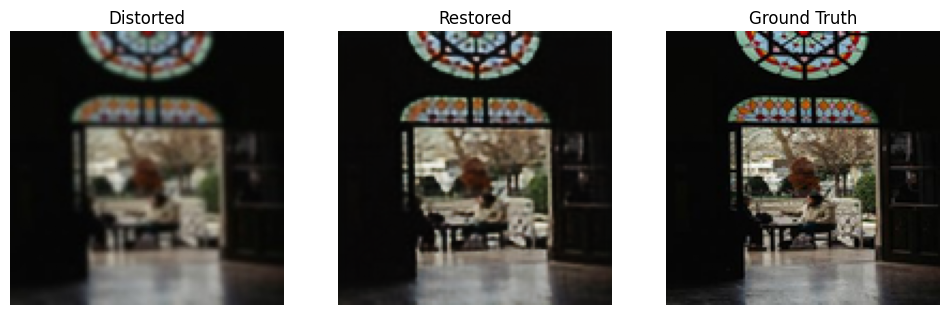

Epoch 76, Loss: 0.0227
Validation PSNR: 30.67, SSIM: 0.9188
Epoch 77, Loss: 0.0228
Validation PSNR: 30.49, SSIM: 0.9199
Epoch 78, Loss: 0.0227
Validation PSNR: 30.80, SSIM: 0.9214
Epoch 79, Loss: 0.0227
Validation PSNR: 30.79, SSIM: 0.9237
Epoch 80, Loss: 0.0227
Validation PSNR: 30.29, SSIM: 0.9136


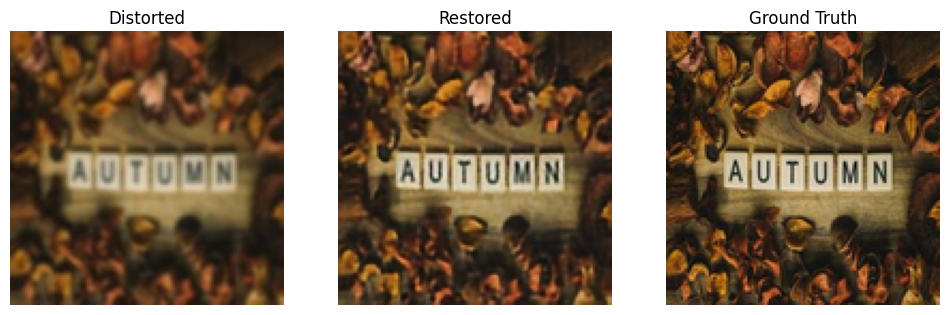

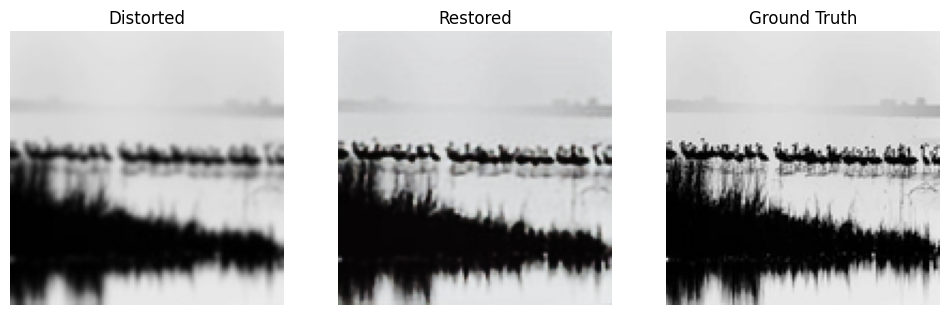

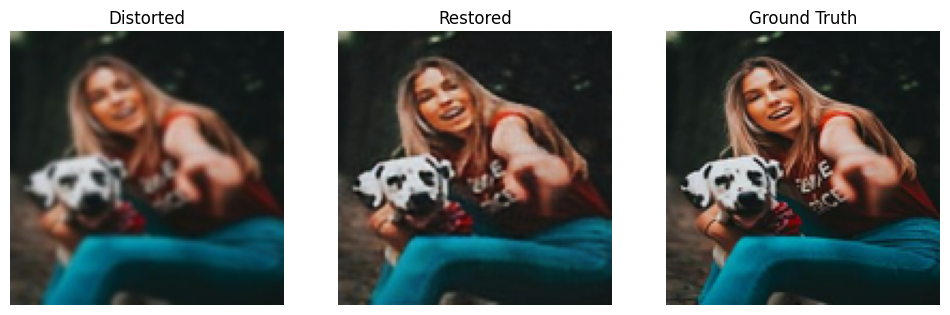

In [ ]:
import os
import torch
from torch.utils.data import DataLoader
from torchvision import transforms

os.makedirs("model_deblur_main_512", exist_ok=True)

if __name__ == '__main__':
    distorted_dir = "unet_train_deblur/blured_128x128"
    clear_dir = "unet_train_deblur/clear_128x128"

    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    dataset = ImageRestorationDataset(distorted_dir, clear_dir, transform)
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    model = UNet().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)  # Reduce LR every 10 epochs by 50%
    criterion = nn.L1Loss()
    
    best_psnr = 0.0  # To keep track of the best PSNR value
    train_losses = []
    val_losses = []

    # Training loop
    for epoch in range(1, 81):
        loss = train(model, dataloader, optimizer, criterion, device)
        scheduler.step()  # Update learning rate after each epoch

        # Evaluate on validation set
        avg_psnr, avg_ssim = evaluate(model, dataloader, device)
        print(f"Epoch {epoch}, Loss: {loss:.4f}")
        print(f"Validation PSNR: {avg_psnr:.2f}, SSIM: {avg_ssim:.4f}")
        
        # Save best model based on PSNR
        if avg_psnr > best_psnr:
            best_psnr = avg_psnr
            torch.save(model.state_dict(), f"model_deblur_main_512/best_psnr_model_main_epoch_{epoch}.pth")
            print(f"✅ Best model updated at epoch {epoch} with PSNR: {avg_psnr:.2f}")

        # Save model every 5 epochs and full checkpoint
        if epoch % 5 == 0:
            torch.save(model.state_dict(), f"model_deblur_main_512/unet_deblur_epoch_{epoch}.pth")  # Epoch-specific model

            # Save full checkpoint for resuming
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': loss,
                'best_psnr': best_psnr,  # Include best PSNR in checkpoint
            }
            torch.save(checkpoint, f"model_deblur_main_512/full_checkpoint_epoch_{epoch}.pth")

            visualize_sample(model, dataloader, device)

    # Optionally, save the final model
    torch.save(model.state_dict(), "unet_deblur_21k_main_512.pth")


In [ ]:
import os
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import transforms
from skimage.metrics import structural_similarity as ssim
import numpy as np

# Create necessary directories
os.makedirs("model_deblur_main", exist_ok=True)

# Define PSNR function
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    max_pixel = 1.0  # Since the images are normalized
    return 20 * np.log10(max_pixel / np.sqrt(mse))

if __name__ == '__main__':
    # Directories for training and validation
    train_distorted_dir = "unet_train_deblur/blured_128x128"
    train_clear_dir = "unet_train_deblur/clear_128x128"
    val_distorted_dir = "unet_train_deblur/val_blur"
    val_clear_dir = "unet_train_deblur/val_clear"

    transform = transforms.Compose([transforms.ToTensor()])

    # Create datasets for training and validation
    train_dataset = ImageRestorationDataset(train_distorted_dir, train_clear_dir, transform)
    val_dataset = ImageRestorationDataset(val_distorted_dir, val_clear_dir, transform)

    # Create dataloaders for training and validation
    train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True)
    val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=False)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    model = UNet().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    criterion = torch.nn.L1Loss()

    best_psnr = 0.0
    train_losses = []
    val_losses = []
    psnr_history = []
    ssim_history = []

    # Training loop
    for epoch in range(1, 3):
        # Training step
        loss = train(model, train_dataloader, optimizer, criterion, device)
        train_losses.append(loss)
        scheduler.step()  # Update learning rate after each epoch

        # Evaluate on validation set
        avg_psnr, avg_ssim, val_loss = evaluate(model, val_dataloader, device, criterion)
        val_losses.append(val_loss)  # Store the validation loss

        # Track PSNR and SSIM
        psnr_history.append(avg_psnr)
        ssim_history.append(avg_ssim)

        print(f"Epoch {epoch}, Loss: {loss:.4f}")
        print(f"Validation PSNR: {avg_psnr:.2f}, SSIM: {avg_ssim:.4f}, Validation Loss: {val_loss:.4f}")
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            'best_psnr': best_psnr,
        }
        torch.save(checkpoint, f"model_deblur_main/full_checkpoint_epoch_{epoch}.pth")
        # Save best model based on PSNR
        if avg_psnr > best_psnr:
            best_psnr = avg_psnr
            torch.save(model.state_dict(), f"model_deblur_main/best_psnr_model_main_epoch_{epoch}.pth")
            print(f"✅ Best model updated at epoch {epoch} with PSNR: {avg_psnr:.2f}")

        # Save model every 5 epochs and full checkpoint
        if epoch % 5 == 0:
            torch.save(model.state_dict(), f"model_deblur_main/unet_deblur_epoch_{epoch}.pth")

        # Save full checkpoint for resuming
        # checkpoint = {
        #     'epoch': epoch,
        #     'model_state_dict': model.state_dict(),
        #     'optimizer_state_dict': optimizer.state_dict(),
        #     'loss': loss,
        #     'best_psnr': best_psnr,
        # }
        # torch.save(checkpoint, f"model_deblur_main/full_checkpoint_epoch_{epoch}.pth")

        # Visualize sample (optional)
        visualize_sample(model, train_dataloader, device)

    # Optionally, save the final model
    torch.save(model.state_dict(), "unet_deblur_21k_main.pth")

    # Plotting training and validation losses
    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, 81), train_losses, label='Training Loss')
    plt.plot(range(1, 81), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')

    # Plotting PSNR and SSIM
    plt.subplot(1, 2, 2)
    plt.plot(range(1, 81), psnr_history, label='PSNR')
    plt.plot(range(1, 81), ssim_history, label='SSIM')
    plt.xlabel('Epochs')
    plt.ylabel('Value')
    plt.legend()
    plt.title('PSNR and SSIM')

    plt.tight_layout()
    plt.show()



TESTING

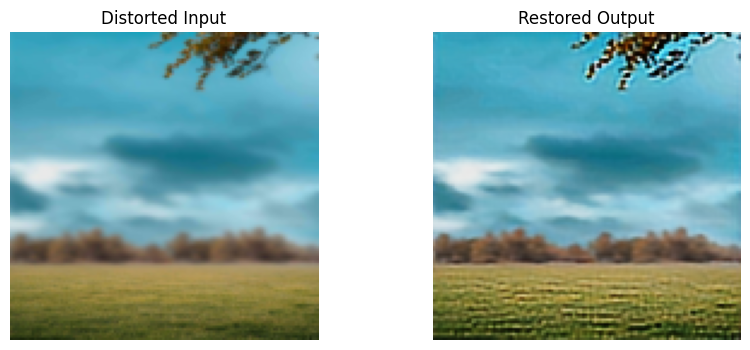

In [11]:
import torch
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

# Re-create your model architecture (UNet in this case)
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, 3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, 3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            )

        def up_block(in_channels, out_channels):
            return nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

        self.enc1 = conv_block(3, 32)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(32, 64)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = conv_block(64, 128)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = conv_block(128, 256)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(256, 512)

        self.up4 = up_block(512, 256)
        self.dec4 = conv_block(512, 256)
        self.up3 = up_block(256, 128)
        self.dec3 = conv_block(256, 128)
        self.up2 = up_block(128, 64)
        self.dec2 = conv_block(128, 64)
        self.up1 = up_block(64, 32)
        self.dec1 = conv_block(64, 32)

        self.final = nn.Conv2d(32, 3, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))

        b = self.bottleneck(self.pool4(e4))

        d4 = self.up4(b)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))
        d3 = self.up3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        return torch.sigmoid(self.final(d1))
# Load the model and its weights
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
model.load_state_dict(torch.load("model_deblur_main/best_psnr_model_main_epoch_47.pth", map_location=device))  # Update with your model path
model.eval()  # Set the model to evaluation mode for inference

# Image preprocessing (resize and convert to tensor)
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize to match the model input size
    transforms.ToTensor(),  # Convert to tensor
])

# 🔍 Load and preprocess a test image
test_img_path = '4.jpg'  # Update with your test image path
img = Image.open(test_img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)  # Add batch dimension (1, C, H, W)

# 🧠 Make prediction
with torch.no_grad():  # Disable gradient calculation for inference
    output_tensor = model(input_tensor)  # Model output

# 🔁 Convert the tensor output back to an image
output_img = output_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()  # (H, W, C)
input_img = input_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()  # (H, W, C)

# 🎨 Display the original and restored images
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.title("Distorted Input")
plt.imshow(input_img)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Restored Output")
plt.imshow(output_img)
plt.axis("off")
plt.show()


In [8]:
model = UNet()

# Step 2: Load weights
model.load_state_dict(torch.load('model_deblur_main/best_psnr_model_main_epoch_47.pth', map_location="cpu"))

# Step 3: Move to device
model = model.to("cpu")

# Step 4: Print summary
from torchsummary import summary
summary(model, input_size=(3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             896
       BatchNorm2d-2         [-1, 32, 128, 128]              64
              ReLU-3         [-1, 32, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           9,248
       BatchNorm2d-5         [-1, 32, 128, 128]              64
              ReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11           [-1, 64, 64, 64]          36,928
      BatchNorm2d-12           [-1, 64, 64, 64]             128
             ReLU-13           [-1, 64, 64, 64]               0
        MaxPool2d-14           [-1, 64,